# M1. Actividad


#### Propósito 
Conocer y aplicar una herramienta para la implementación de sistemas multiagentes.

#### Instrucciones 
Para este problema, deberás entregar, de manera individual, un informe en PDF que estudie las estadísticas de un robot de limpieza reactivo, así como el enlace al repositorio en Github del código desarrollado para esta actividad. El código debe ajustarse al estilo solicita en el siguiente documento.

#### Dado:

- Habitación de MxN espacios.
- Número de agentes.
- Porcentaje de celdas inicialmente sucias.
- Tiempo máximo de ejecución.

#### Realiza la siguiente simulación:

- Inicializa las celdas sucias (ubicaciones aleatorias).
- Todos los agentes empiezan en la celda [1,1].
- En cada paso de tiempo:
    - Si la celda está sucia, entonces aspira.
    - Si la celda está limpia, el agente elije una dirección aleatoria para moverse (unas de las 8 celdas vecinas) y elije la acción de movimiento (si no puede moverse allí, permanecerá en la misma celda).
- Se ejecuta el tiempo máximo establecido.

#### Para un espacio de 100x100, considera los siguientes escenarios:

- Escenario 1: 1 agente, 90% de celdas sucias.
- Escenario 2. 2 agentes, 90% de celdas sucias.

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### Imports

In [24]:
from mesa import Agent, Model
from mesa.time import SimultaneousActivation
from mesa.space import MultiGrid
from mesa.datacollection import DataCollector

import numpy as np
#import pandas as pd

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt 
from matplotlib.animation import FuncAnimation
#import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['animation.embed_limit'] = 2**128

import time

### Agents

In [25]:
class CleaningAgent(Agent):
    def __init__(self, unique_id, model):
        super().__init__(unique_id, model)

    def move(self):
        possible_steps = self.model.grid.get_neighborhood(
            self.pos,
            moore=True,  # Para incluir diagonales
            include_center=False)
        new_position = self.random.choice(possible_steps)
        self.model.grid.move_agent(self, new_position)

    def clean(self):
        cell_contents = self.model.grid.get_cell_list_contents([self.pos])
        for content in cell_contents:
            if isinstance(content, Dirt) and content.dirty:
                content.dirty = 0  # Limpia la celda

    def step(self):
        self.move()  # Primero mueves el agente
        self.clean() # Luego el agente limpia la celda

# Se define el agente de suciedad.
class Dirt(Agent):
    def __init__(self, unique_id, model):
        super().__init__(unique_id, model)
        self.dirty = 1

### Model

In [26]:
class CleaningModel(Model):
    def __init__(self, width, height, initial_dirt, num_cleaners):
        self.grid = MultiGrid(width, height, True)
        self.schedule = SimultaneousActivation(self)

        # Colocar agentes de limpieza en el grid en la posición (1,1).
        for i in range(num_cleaners):
            cleaner = CleaningAgent(i, self)
            self.grid.place_agent(cleaner, (1, 1))
            self.schedule.add(cleaner)

        # Colocar la suciedad (dirt) en el grid.
        for i in range(initial_dirt):
            x = self.random.randrange(self.grid.width)
            y = self.random.randrange(self.grid.height)
            dirt = Dirt(i + num_cleaners, self)  # Asegúrate de usar un ID único
            self.grid.place_agent(dirt, (x, y))

        self.datacollector = DataCollector(
            model_reporters={
                "Dirt": lambda m: sum(1 for cell in m.grid.coord_iter() for content in m.grid.get_cell_list_contents(cell[1]) if isinstance(content, Dirt) and content.dirty),
                "Clean": lambda m: m.grid.width * m.grid.height - sum(1 for cell in m.grid.coord_iter() for content in m.grid.get_cell_list_contents(cell[1]) if isinstance(content, Dirt) and content.dirty),
                "Grid": self.get_grid,
            }
        )

    def step(self):
        self.datacollector.collect(self)
        self.schedule.step()

    def get_grid(self):
        grid = np.zeros((self.grid.width, self.grid.height))
        for cell_contents, (x, y) in self.grid.coord_iter():
            dirty = any(isinstance(content, Dirt) and content.dirty for content in cell_contents)
            grid[x][y] = 1 if dirty else 0
        return grid


 ## Inicialización y ejecución: steps 100, 1000, 10000

In [27]:
width = 100
height = 100
num_steps = 1000
initial_dirt = int(width * height * 0.9) # El 90% de las celdas están inicialmente sucias
num_cleaners = 2

start_time = time.time()

model = CleaningModel(width, height, initial_dirt, num_cleaners)
# Avanzar el modelo algunos pasos
for i in range(num_steps):
    model.step()

end_time = time.time()

all_grid = model.datacollector.get_model_vars_dataframe()

### Animación

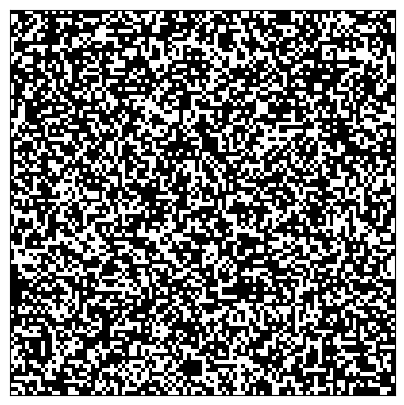

In [28]:
# Crear la animación

# Asegurarse de que all_grid tenga datos
if len(all_grid) > 0:

    # Función para actualizar la animación
    def animate(frame):
        patch.set_data(all_grid.iloc[frame]["Grid"])
        return patch,

    # Crear la animación
    fig, axis = plt.subplots(figsize=(5, 5))
    axis.set_xticks([])
    axis.set_yticks([])
    patch = plt.imshow(all_grid.iloc[0]["Grid"], cmap=plt.cm.binary)
    anim = FuncAnimation(fig, animate, frames=range(num_steps), interval=200)
    plt.show()


In [29]:
anim

 ## Inicialización y ejecución: Total Steps para limpiar todo

In [5]:
width = 100
height = 100
initial_dirt = int(width * height * 1) # Todas las celdas están sucias
num_cleaners = 2

start_time = time.time()

model = CleaningModel(width, height, initial_dirt, num_cleaners)

# Ciclo while que se ejecuta hasta que todas las celdas estén limpias
i = 0  # Contador de pasos
while True:
    model.step()
    current_dirt_count = model.datacollector.get_model_vars_dataframe()["Dirt"].iloc[-1]
    if current_dirt_count == 0:
        print(f"Todas las celdas están limpias después de {i+1} pasos.")
        break
    i += 1

end_time = time.time()

simulation_duration = end_time - start_time
print(f"La simulación tomó {simulation_duration:.2f} segundos.")

Todas las celdas están limpias después de 95031 pasos.
La simulación tomó 3148.23 segundos.


### Datos Obtenidos

In [10]:
for i in range(num_steps):
    model.step()

# Acceder a los datos recolectados
model_data = model.datacollector.get_model_vars_dataframe()

# Si hay datos recolectados, calcular el porcentaje de suciedad
if not model_data.empty:
    final_dirt_count = model_data["Dirt"].iloc[-1]
    total_cells = width * height
    percentage_dirty = (final_dirt_count / total_cells) * 100

    print(f"Porcentaje de celdas sucias al final: {percentage_dirty:.2f}%")
else:
    print("No hay datos recolectados.")

simulation_duration = end_time - start_time
print(f"La simulación tomó {simulation_duration:.2f} segundos.")



Porcentaje de celdas sucias al final: 42.16%
La simulación tomó 21.77 segundos.


###  cantidad óptima de aspiradoras

In [20]:
resultados = []

width = 20
height = 20
initial_dirt = int(width * height * 1)

for num_cleaners in range(1, 11):  # De 1 a 10 aspiradoras
    model = CleaningModel(width, height, initial_dirt, num_cleaners)
    start_time = time.time()
    
    i = 0
    while True:
        model.step()
        current_dirt_count = model.datacollector.get_model_vars_dataframe()["Dirt"].iloc[-1]
        if current_dirt_count == 0:
            break
        i += 1

    end_time = time.time()
    simulation_duration = end_time - start_time
    resultados.append((num_cleaners, simulation_duration))

# Después de todas las simulaciones, imprime los resultados
for num_cleaners, duration in resultados:
    print(f"Aspiradoras: {num_cleaners}, Tiempo de limpieza: {duration:.2f} segundos")


Aspiradoras: 1, Tiempo de limpieza: 4.52 segundos
Aspiradoras: 2, Tiempo de limpieza: 1.66 segundos
Aspiradoras: 3, Tiempo de limpieza: 1.92 segundos
Aspiradoras: 4, Tiempo de limpieza: 1.42 segundos
Aspiradoras: 5, Tiempo de limpieza: 0.71 segundos
Aspiradoras: 6, Tiempo de limpieza: 0.53 segundos
Aspiradoras: 7, Tiempo de limpieza: 0.69 segundos
Aspiradoras: 8, Tiempo de limpieza: 0.50 segundos
Aspiradoras: 9, Tiempo de limpieza: 0.47 segundos
Aspiradoras: 10, Tiempo de limpieza: 0.36 segundos
